# 🍅 Rotten Tomatoes 🍅

In this notebook, we will fine-tune a binary classifier on the [rotten tomatoes dataset](https://huggingface.co/datasets/rotten_tomatoes) hosted on hugging face. 

[Rotten Tomatoes](https://www.rottentomatoes.com/) is a website where people review movies from 1 to 5 stars. The reviews in this dataset are only annotated as positive or negative, and the datacard on the hugging face hub doesn't make it clear what the threshold was for classifying a review as negative or positive. This is an important consideration when evaluating our results of this model.

## Optional Precursor: for anyone new to colaboratory notebooks:

Tips:

1. To run the cells, you can use the keyboard shortcut `Shift + Enter` or use the menu bar to run the cells.

2. A lot of the cells in these notebooks are commented out to hide the output. This keeps the notebook size down and makes it easier to read. If you want to see the output, you can uncomment the cells and run them. It also gives you the opportunity to guess what the output will be before running the cell.  
   
   To toggle whether the python lines are commented out or executable, you can select all the lines you want to uncomment and use the keyboard shortcut `Ctrl + /` or `Cmd + /` on a Mac.

3. To navigate to different sections, you can click the down carrot arrow next to any markdown cell to collapse all cells within that section 

## Optional: Design Decisions

#### **The dataset** 

We are starting with this dataset because it is small and there are only two labels: 'fresh' and 'rotten'. This is a binary classifier which makes it a bit easier to interpret the results.

#### **The model**   

We will use the DistilBERT model, specifically, the (distil-bert-base-uncased)[https://huggingface.co/distilbert-base-uncased] model.  


It is a smaller version of the BERT model. It's faster to train, but it still achieves good results.    

We know that's an unsatisfying answer given the plethora of options we continue to be flooded with.

#### **For now, focus on getting a high level sense of the steps involved to fine-tuning a model.**  

Later, you can come back to this notebook and spend more time on the deep dive sections. I will continue to update the readme with suggested resources, that might help you look into different models, their architectures, and the tradeoffs involved in choosing one over the other.

# Step 1: Load, inspect and down-sample our dataset

We will use the HuggingFace library to load the dataset and finetune the model. Then we will use the pandas library to explore the dataset.

### Load the data from huggingface

In [ ]:
 %%capture
# %%capture just hides the output of a cell. Installing libraries produces a lot of output we don't care about unless something doesn't seem to load as we expect it to, they we may want to comment it out to see the output when we run this cell.
!pip install datasets # uncomment this to install the datasets library! 
!pip install pandas # uncomment this to install the pandas library!

In [ ]:
from datasets import load_dataset # this is a huggingface library for loading datasets
import pandas as pd # we'll use the pandas library to explore the dataset

The help() function is your friend! Wrap any function or class with the help function to quickly read documentation 

In [ ]:
# help(load_dataset) # uncomment this to see the documentation for the load_dataset function

In [ ]:
# load a dataset from the Hugging Face Hub
dataset = load_dataset("rotten_tomatoes") # this is a dataset of movie reviews from Rotten Tomatoes

In [ ]:
dataset

What are some observations of this DatasetDict object?  

- There are three keys: train, test, and validation.
- each key contains a Dataset object, which tells us how many examples are in the dataset, and what the column names are.

### Downsample the dataset

In [ ]:
# create a new dataset with 1000 training samples and 200 test samples
# stratify by column: ensures that the train and test sets have the same proportion of each class as the full dataset
dataset = dataset["train"].train_test_split(train_size=1000, test_size=200, seed=42, stratify_by_column="label")

#### Optional Exercise: Get to know the Dataset object

In [ ]:
type(dataset["train"])


In [ ]:
dataset.keys()

In [ ]:
dataset["train"].features

In [ ]:
dataset["train"]["label"][0]

### Optional Exercise: Inspect the data with pandas

In [ ]:
df_train = pd.DataFrame(dataset['train']) # convert the dataset to a pandas dataframe

In [ ]:
df_train.head()

In [ ]:
df_train.label.value_counts()

We have balanced classes for the training set! Let's make sure we do for the test and validation set as well. Run the code above for the validation and test sets.

In [ ]:
# YOUR CODE HERE: 
# Load the validation set into a pandas dataframe and use the function value_counts() to output the number of positive and negative reviews in the validation set.
# Are the labels in the validation set balanced?

In [ ]:
# YOUR CODE HERE: Same as above, now for the test set. Are the labels in the test set balanced?

Let's take a look at some of the negative reviews:

In [ ]:
# for text in df[df.label == 0].text:
#     print(f'{text}\n')

In [ ]:
# YOUR CODE HERE: Modify the code above to see some examples of positive reviews

# Step 2: TOKENIZE ZE DATA!

(Prepare the text to be fed to the model)

In this section, we will:
   1. load the tokenizer
   2. define a tokenization function for batch processing
   3. tokenize our training, test, and validation text inputs (with parallel processing!)

Every model expects our text input to be tokenized with the **same** tokenizer that the model was trained with.

The cookie monster would be very confused if you tried to feed it vegetables.

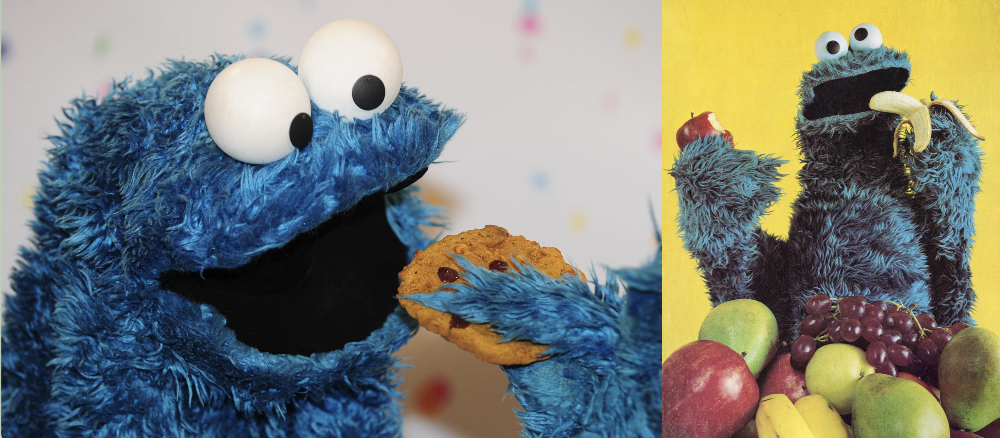

For these steps, we'll use the Hugging Face transformers library. 

In [ ]:
%%capture
!pip install transformers # uncomment this to install the transformers library!

In [ ]:
from transformers import AutoTokenizer # this is a huggingface library for tokenizing text

AutoTokenizer is a class that contains a bunch of useful functions for tokenizing text. 

You can specify which tokenizer you want to use by passing in the name of the model you plan to input the tokenized data into.  

For example, if you want to use the tokenizer for the BERT model, you would pass in "bert-base-cased". If you want to use the tokenizer for the GPT-2 model, you would pass in "gpt2".  

In our case, we want to use the tokenizer for distilBERT, so we'll pass in "distilbert-base-uncased".

In [ ]:
# 1. Load the tokenizer and define the tokenization function
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")

# 2. Define the tokenization function
def tokenize_function(examples):
    """This function tokenizes the text in the examples dictionary. We pass it to the map function of the dataset so that we can batch the tokenization for efficiency by tokenizing batches in parallel.

    Args:
        examples (datasets.arrow_dataset.Dataset): examples: dataset["train"], or dataset["test"], which includes the text we want to tokenize.

    Returns:
        dictionary: The tokenized text and the associated attention mask. The attention mask is a binary tensor indicating the position of the padded indices so that the model does not attend to them. (see https://huggingface.co/transformers/glossary.html#attention-mask)
    """
    return tokenizer(examples["text"], padding="max_length", truncation=True)

# 3. Tokenize our training and test data
tokenized_datasets = dataset.map(tokenize_function, batched=True)

### Optional Exercise: Dive deeper into how the tokenize_function works

In [ ]:
# the input argument to our tokenize_function
type(dataset["train"])

In [ ]:
# an example of what the map function is doing. It's just applying the tokenize_function to a batch of the training set, in parallel, aggregating the results and returning the tokenized text in a dictionary
tokenized_batch_sample = tokenize_function(dataset["train"][:10])

In [ ]:
# technically the dictionary that's returned is a special type of dictionary called a "BatchEncoding" that has some extra functionality. We can convert it to a regular dictionary with the to_dict() method. 
type(tokenized_batch_sample)

In [ ]:
tokenized_batch_sample.keys()

In [ ]:
print(tokenized_batch_sample["input_ids"][0])

In [ ]:
print(tokenized_batch_sample["input_ids"][0][46:])

In [ ]:
print(tokenized_batch_sample["attention_mask"][0][46:])

Let's now compare our initial input text to the tokenized text!

In [ ]:
dataset["train"][:10].keys()

In [ ]:
print(f'tokenized training data:    {tokenized_datasets["train"][:10].keys()}')
print(f'tokenized test data:        {tokenized_datasets["test"][:10].keys()}')
print(f'tokenized validation data:  {tokenized_datasets["validation"][:10].keys()}')

In [ ]:
tokenized_datasets["validation"][:10].keys()

In [ ]:
tokenized_datasets["test"][:10].keys()

That dataset.map function is pretty nifty!  

It applied the tokenizer function to all three datasets in one line of code and ran our tokenizer function on batches in parallel!!    

This makes tokenizing large datasets much faster, and it is especially useful for large datasets that won't fit in memory all at once. THEN it aggregated the results and returns a new dataset dictionary that includes the tokenized text and the attention mask FOR ALL THREE datasets in one dataset dictionary object. 👀😲

# Step 3: Load in the pre-trained model!  

We will need the class AutoModelForSequenceClassification from the transformers library.  

We need to specify the specific DistilBert model we want to use with the argument from_pretrained as well as how many classes there our.

Remember in our case, we picked the model [distil-bert-base-uncased](https://huggingface.co/distilbert-base-uncased)

And we have two classes: "fresh" or "rotten"

In [ ]:
from transformers import AutoModelForSequenceClassification

In [ ]:
model = AutoModelForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=2)

# Step 4: Define an evaluation metric

In [ ]:
%%capture
!pip install evaluate

In [ ]:
import evaluate

In [ ]:
# clf_metrics = evaluate.combine(["accuracy", "f1", "precision", "recall"])

# define the evaluation metric
metric = evaluate.load("accuracy")

def compute_metrics(eval_pred):
    """This function computes the accuracy, f1, precision and recall for the model's predictions.
    Args:
        eval_pred (Tuple[numpy.ndarray, numpy.ndarray]): A tuple containing the model's predictions and the labels. The predictions are a numpy array of shape (batch size, number of classes) containing the logits for each class. The labels are a numpy array of shape (batch size,) containing the labels for each example.
    
    Returns: 
        dictionary: A dictionary containing the accuracy, f1, precision and recall for the model's predictions.
    """
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    #return clf_metrics.compute(predictions=predictions, references=labels)
    return metric.compute(predictions=predictions, references=labels)

# Step 5: Define the training arguments

The TrainingArguments class allows us to specify hyperparameters for training the model and also allows us to specify where we want to save the training results and logs. We will pass these arguments via the TrainingArguments class to the Trainer class in the next section.

In [ ]:
from transformers import TrainingArguments

# define the training arguments
training_args = TrainingArguments(
    output_dir="./rotten_tomatoes_baseline_results",          # output directory
    evaluation_strategy="epoch",
    #metric_for_best_model="f1",
    num_train_epochs=2,
)

# Step 6: Define the training arguments and instantiate the Trainer class

We will use the Trainer class from the transformers library to train our model.

To see the latest documentation of all the steps (that are customizable) that the Trainer class is taking care of for us under the hood, see the [Trainer class documentation](https://huggingface.co/docs/transformers/main_classes/trainer)


We are truly standing on the shoulders of giants here, abstracting away so much for us to get started quickly! 😍 But don't get too comfortable, we will still need to understand the training loop and the evaluation loop in order to tune our model for better performance.

In [ ]:
from transformers import Trainer

# instantiate the Trainer class
trainer = Trainer(
    model=model,                         # the instantiated 🤗 Transformers model to be trained
    args=training_args,                  # training arguments, defined above
    train_dataset=tokenized_datasets["train"],         # training dataset
    eval_dataset=tokenized_datasets["test"],     # evaluation dataset
    compute_metrics=compute_metrics,    # the function that computes the metrics of interest
)

# Step 7: Train the model! 😃

In [ ]:
trainer.train()

In [ ]:
# Step 7: Evaluate the model

trainer.evaluate()